# Imports

In [ ]:
import torch
import torch.nn as nn
from PIL import Image
import os
import numpy as np
from torch.utils.data import Dataset
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision.utils import save_image
from torch.utils.tensorboard import SummaryWriter
import PIL
import matplotlib.pyplot as plt
from torchvision import transforms

In [ ]:
writer = SummaryWriter("runs/train")

# Model Structure

the whole model followed the pix2pix paper along with some differences in the generator that proofed to give better results
The key features of the generator are:

##Generator
The generator follows a modified U-Net architecture, which is ideal for tasks involving image-to-image translation, such as semantic segmentation or style transfer.

#### Encoder:

- Consists of a series of convolutional layers with increasing filter sizes to capture hierarchical features.
- Each convolutional layer is followed by Batch Normalization (except the input layer) and Leaky ReLU activation.
- Downsampling is performed using stride-2 convolutions instead of pooling to retain spatial structure.

#### Bottleneck:

- The bottleneck captures the most abstract and compressed representation of the input.
- Multiple convolutional layers with increasing depth are used.

#### Decoder:

- A symmetric decoder mirrors the encoder.
- Each layer includes a transposed convolution (deconvolution) for upsampling, followed by Batch Normalization and ReLU activation.
- Skip connections from the encoder to the decoder are employed to preserve fine-grained details, typical of U-Net architectures.


##Discriminator
The discriminator follows a PatchGAN architecture, as described in the Pix2Pix paper. Instead of classifying the entire image as real or fake, PatchGAN focuses on local patches, enabling it to enforce structural consistency at different scales.

Resources:
- https://arxiv.org/pdf/1611.07004
- https://youtu.be/SuddDSqGRzg?si=JiYAKmrOR6PlD6uJ
- https://medium.com/@alejandro.itoaramendia/decoding-the-u-net-a-complete-guide-810b1c6d56d8


In [ ]:
def compute_gradient_map(img):
            fx = torch.tensor([[-1, 0, 1]]).to(img.device)
            fy = fx.t()

            grad_x = F.conv2d(img, fx.unsqueeze(0).unsqueeze(0), padding=1)
            grad_y = F.conv2d(img, fy.unsqueeze(0).unsqueeze(0), padding=1)

            return torch.sqrt(grad_x*2 + grad_y*2)

        structural_loss = F.mse_loss(
            compute_gradient_map(original),
            compute_gradient_map(stylized)
        )

        # Composite Loss
        total_loss = (
            0.4 * semantic_loss +
            0.3 * distribution_loss +
            0.3 * structural_loss
        )

In [ ]:
class CNNBLock(nn.Module):
  def __init__(self, in_channels, out_channels, stride = 2) :
    super().__init__()
    self.conv = nn.Sequential(
        nn.Conv2d(in_channels,
                  out_channels,
                  kernel_size = 4,
                  stride = stride,
                  bias = False,
                  padding_mode = "reflect"),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )


  def forward(self, x) :
    return self.conv(x)

In [ ]:
class Discriminator(nn.Module):
  def __init__(self, in_channels = 3, features = [64,128,256,512]):
    super().__init__()

    self.initial = nn.Sequential(
        nn.Conv2d(in_channels * 2, #because we will get both x (input image) & y (output image)
                  features[0],
                  kernel_size = 4,
                  stride = 2,
                  padding = 1,
                  padding_mode = "reflect"),
        nn.LeakyReLU(0.2)
    )
    layers = []
    in_channels = features[0]

    for feature in features[1:] : # starting fromt idx = 1 because 0 is used in "initial"

      layers.append(
          CNNBLock(in_channels, feature, stride = 1 if feature == 512 else 2)
      )
      in_channels = feature

    layers.append(
        nn.Conv2d(in_channels,
                  1,
                  kernel_size = 4,
                  stride = 1,
                  padding = 1,
                  padding_mode = "reflect")
    )

    self.model = nn.Sequential(*layers)

  def forward(self, x, y) :

    x = torch.cat([x,y], dim = 1) # concate around channels
    x = self.initial(x)
    return self.model(x)

In [ ]:
class Block(nn.Module) :

  def __init__(self,
               in_channels,
               out_channels,
               down = True,
               act = "relu",
               use_dropout = False) :
    super().__init__()

    self.conv = nn.Sequential(nn.Conv2d(in_channels,
                                        out_channels,
                                        kernel_size = 4,
                                        stride = 2 ,
                                        padding = 1 ,
                                        bias = False,
                                        padding_mode = "reflect")
                              if down
                              else nn.ConvTranspose2d(in_channels,
                                                       out_channels,
                                                       kernel_size = 4,
                                                       stride = 2,
                                                       padding = 1,
                                                      bias = False),
                              nn.BatchNorm2d(out_channels),
                              nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2)
                              )
    self.use_dropout = use_dropout
    self.dropout = nn.Dropout(0.5)

  def forward(self,x):
    x = self.conv(x)

    return self.dropout(x) if self.use_dropout else x

In [ ]:
class Generator(nn.Module) :

  def __init__(self, in_channels = 3, features = 64):
    super().__init__()

    self.initial_down = nn.Sequential(
        nn.Conv2d(in_channels,
                  features,
                  kernel_size = 4,
                  stride = 2,
                  padding = 1,
                  padding_mode = "reflect"),
        nn.LeakyReLU(0.2)
    )#128

    self.down1 = Block(features, features * 2, down = True, act = "leaky", use_dropout = False)#64
    self.down2 = Block(features * 2, features * 4, down = True, act = "leaky", use_dropout = False)#32
    self.down3 = Block(features * 4, features * 8, down = True, act = "leaky", use_dropout = False)#16
    self.down4 = Block(features * 8, features * 8, down = True, act = "leaky", use_dropout = False)#8
    self.down5 = Block(features * 8, features * 8, down = True, act = "leaky", use_dropout = False)#4
    self.down6 = Block(features * 8, features * 8, down = True, act = "leaky", use_dropout = False)#2

    self.bottleneck = nn.Sequential(
        nn.Conv2d(features * 8, features * 8, kernel_size = 4, stride = 2, padding = 1), #1x1
        nn.ReLU()
    )

    self.up1 = Block(features * 8, features * 8, down = False, act = "relu", use_dropout = True)
    self.up2 = Block(features * 8 * 2, features * 8, down = False, act = "relu", use_dropout = True)
    self.up3 = Block(features * 8 * 2, features * 8, down = False, act = "relu", use_dropout = True)
    self.up4 = Block(features * 8 *2, features * 8, down = False, act = "relu", use_dropout = False)
    self.up5 = Block(features * 8 * 2, features * 4, down = False, act = "relu", use_dropout = False)
    self.up6 = Block(features * 4 * 2, features * 2, down = False, act = "relu", use_dropout = False)
    self.up7 = Block(features * 2 * 2, features , down = False, act = "relu", use_dropout = False)

    self.final_up = nn.Sequential(
        nn.ConvTranspose2d(features * 2,
                           in_channels,
                           kernel_size = 4,
                           stride = 2,
                           padding = 1),
        nn.Tanh()
    )


  def forward(self,x):
    d1 = self.initial_down(x)
    d2 = self.down1(d1)
    d3 = self.down2(d2)
    d4 = self.down3(d3)
    d5 = self.down4(d4)
    d6 = self.down5(d5)
    d7 = self.down6(d6)

    bottleneck = self.bottleneck(d7)
    up1 = self.up1(bottleneck)
    up2 = self.up2(torch.cat([up1, d7], dim = 1))
    up3 = self.up3(torch.cat([up2, d6], dim = 1))
    up4 = self.up4(torch.cat([up3, d5], dim = 1))
    up5 = self.up5(torch.cat([up4, d4], dim = 1))
    up6 = self.up6(torch.cat([up5, d3], dim = 1))
    up7 = self.up7(torch.cat([up6, d2], dim = 1))
    return self.final_up(torch.cat([up7, d1], dim = 1))





# Configurations

In [ ]:
#Config
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TRAIN_DIR = "/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/train"
VAL_DIR = "/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/val"
TEST_DIR = "/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/test"
LEARNING_RATE = 1e-5
BATCH_SIZE = 10
NUM_WORKERS = 1
IMAGE_SIZE = 256
CHANNELS_IMG = 3
L1_LAMBDA = 100
NUM_EPOCHS = 1000
LOAD_MODEL = False
SAVE_MODEL = False
CHECKPOINT_DISC = "disc.pth.tar"
CHECKPOINT_GEN = "gen.pth.tar"

both_transform = A.Compose(
    [A.Resize(width=256, height=256),], additional_targets={"image0": "image"},
)

transform_only_input = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.ColorJitter(p=0.2),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

transform_only_target = A.Compose(
    [
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

In [ ]:
#utils
import torch
from torchvision.utils import save_image

def save_some_examples(gen, val_loader, epoch, folder):
    x, y = next(iter(val_loader))
    x, y = x.to(DEVICE), y.to(DEVICE)
    gen.eval()
    with torch.no_grad():
        y_fake = gen(x)
        y_fake = y_fake * 0.5 + 0.5  # remove normalization#
        writer.add_images("input", x * 0.5 + 0.5, global_step=epoch)
        writer.add_images("ground truth", y * 0.5 + 0.5, global_step=epoch)
        writer.add_images("fake", y_fake * 0.5 + 0.5, global_step=epoch)
    gen.train()


def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

# Custom Dataset

The dataset consists of images with a shape of **3 x 512 x 256**, where the **input image** and **target image** are concatenated side-by-side. The left half of the image (**256 x 256**) represents the input, and the right half (**256 x 256**) represents the target.

To handle this format, a custom dataset class is implemented to:
1. **Split the Image**: The concatenated image is split along the width dimension into two separate images: the input and the target.
2. **Apply Transformations**: Different transformations are applied to the input and target images to prepare them for training. Transformations include resizing, normalization, and data augmentation like random flipping or cropping.

This approach ensures that the input and target images are correctly separated and preprocessed for use in the model.


In [ ]:
class CustomDataset(Dataset):

  def __init__(self, root_dir):
    self.root_dir = root_dir
    self.list_files = os.listdir(self.root_dir)
    print(self.list_files)

  def __getitem__(self, index):

    img_file = self.list_files[index]
    img_path = os.path.join(self.root_dir,img_file)
    image = np.array(Image.open(img_path))

    input_image = image[:,256:,:] #each image is 256x256, we have both concatenated
    target_image = image[:,:256,:]

    augmentations = both_transform(image = input_image, image0 = target_image)
    input_image = augmentations["image"]
    target_image = augmentations["image0"]

    input_image = transform_only_input(image = input_image)["image"]
    target_image = transform_only_target(image = target_image)["image"]

    return input_image, target_image


  def __len__(self) :
    return len(self.list_files)

In [ ]:
train_dataset = CustomDataset("/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/train")
train_loader = DataLoader(train_dataset,
                          batch_size = BATCH_SIZE,
                          shuffle = True,
                          num_workers = 1)

['158.jpg', '121.jpg', '18.jpg', '112.jpg', '127.jpg', '162.jpg', '116.jpg', '123.jpg', '110.jpg', '244.jpg', '235.jpg', '196.jpg', '217.jpg', '101.jpg', '171.jpg', '224.jpg', '179.jpg', '10.jpg', '17.jpg', '125.jpg', '245.jpg', '195.jpg', '161.jpg', '194.jpg', '136.jpg', '227.jpg', '111.jpg', '141.jpg', '223.jpg', '182.jpg', '122.jpg', '147.jpg', '189.jpg', '184.jpg', '115.jpg', '133.jpg', '175.jpg', '239.jpg', '174.jpg', '201.jpg', '113.jpg', '154.jpg', '117.jpg', '242.jpg', '228.jpg', '20.jpg', '153.jpg', '206.jpg', '155.jpg', '186.jpg', '19.jpg', '139.jpg', '192.jpg', '104.jpg', '152.jpg', '157.jpg', '243.jpg', '126.jpg', '230.jpg', '190.jpg', '203.jpg', '219.jpg', '109.jpg', '197.jpg', '114.jpg', '240.jpg', '202.jpg', '142.jpg', '2.jpg', '187.jpg', '149.jpg', '238.jpg', '164.jpg', '213.jpg', '165.jpg', '146.jpg', '24.jpg', '169.jpg', '221.jpg', '214.jpg', '241.jpg', '233.jpg', '13.jpg', '218.jpg', '12.jpg', '131.jpg', '181.jpg', '156.jpg', '178.jpg', '118.jpg', '216.jpg', '204.jpg

In [ ]:
val_dataset = CustomDataset("/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/val")
val_loader = DataLoader(train_dataset,
                          batch_size = BATCH_SIZE,
                          shuffle = True,
                          num_workers = 1)

['63.jpg', '89.jpg', '3.jpg', '88.jpg', '54.jpg', '4.jpg', '69.jpg', '72.jpg', '51.jpg', '71.jpg', '32.jpg', '38.jpg', '16.jpg', '25.jpg', '97.jpg', '44.jpg', '28.jpg', '65.jpg', '79.jpg', '66.jpg', '49.jpg', '59.jpg', '95.jpg', '98.jpg', '5.jpg', '60.jpg', '2.jpg', '14.jpg', '93.jpg', '68.jpg', '87.jpg', '7.jpg', '67.jpg', '45.jpg', '85.jpg', '6.jpg', '29.jpg', '83.jpg', '36.jpg', '39.jpg', '55.jpg', '11.jpg', '23.jpg', '46.jpg', '94.jpg', '74.jpg', '61.jpg', '84.jpg', '99.jpg', '77.jpg', '24.jpg', '90.jpg', '81.jpg', '13.jpg', '48.jpg', '9.jpg', '52.jpg', '37.jpg', '26.jpg', '40.jpg', '35.jpg', '92.jpg', '33.jpg', '12.jpg', '41.jpg', '19.jpg', '27.jpg', '21.jpg', '96.jpg', '50.jpg', '75.jpg', '56.jpg', '43.jpg', '82.jpg', '78.jpg', '80.jpg', '1.jpg', '57.jpg', '17.jpg', '73.jpg', '76.jpg', '64.jpg', '100.jpg', '62.jpg', '20.jpg', '53.jpg', '15.jpg', '30.jpg', '8.jpg', '58.jpg', '10.jpg', '18.jpg', '86.jpg', '42.jpg', '34.jpg', '91.jpg', '70.jpg', '47.jpg', '22.jpg', '31.jpg']


In [ ]:
test_dataset = CustomDataset("/content/drive/MyDrive/ICS471 - Project/datasets/facades 2/test")
test_loader = DataLoader(train_dataset,
                          batch_size = 1,
                          shuffle = True,
                          num_workers = 1)

['1.jpg', '53.jpg', '40.jpg', '91.jpg', '106.jpg', '15.jpg', '86.jpg', '84.jpg', '77.jpg', '58.jpg', '92.jpg', '65.jpg', '35.jpg', '12.jpg', '103.jpg', '13.jpg', '85.jpg', '82.jpg', '57.jpg', '78.jpg', '37.jpg', '47.jpg', '38.jpg', '71.jpg', '93.jpg', '3.jpg', '89.jpg', '23.jpg', '46.jpg', '2.jpg', '31.jpg', '19.jpg', '4.jpg', '50.jpg', '34.jpg', '11.jpg', '56.jpg', '62.jpg', '33.jpg', '48.jpg', '99.jpg', '36.jpg', '79.jpg', '70.jpg', '88.jpg', '22.jpg', '63.jpg', '27.jpg', '17.jpg', '9.jpg', '76.jpg', '14.jpg', '41.jpg', '94.jpg', '21.jpg', '7.jpg', '54.jpg', '67.jpg', '8.jpg', '5.jpg', '18.jpg', '60.jpg', '83.jpg', '102.jpg', '72.jpg', '39.jpg', '100.jpg', '45.jpg', '81.jpg', '96.jpg', '104.jpg', '20.jpg', '105.jpg', '32.jpg', '95.jpg', '16.jpg', '10.jpg', '68.jpg', '44.jpg', '64.jpg', '6.jpg', '43.jpg', '61.jpg', '30.jpg', '28.jpg', '69.jpg', '87.jpg', '49.jpg', '101.jpg', '51.jpg', '66.jpg', '24.jpg', '29.jpg', '90.jpg', '59.jpg', '42.jpg', '25.jpg', '55.jpg', '97.jpg', '73.jpg', '

# Training Loop

The training loop alternates between training the **Discriminator** and the **Generator**:

## 1. Train Discriminator:
- **Goal**: Distinguish real images (`y`) from fake images (`y_fake`) generated by the Generator.
- **Steps**:
  1. Compute BCE loss for real images (`D_real_loss`).
  2. Compute BCE loss for fake images (`D_fake_loss`).
  3. Combine losses to update the Discriminator.

## 2. Train Generator:
- **Goal**: Generate realistic images (`y_fake`) that:
  1. Fool the Discriminator (adversarial loss).
  2. Match the ground truth (`y`) using L1 loss.
- **Steps**:
  1. Compute BCE loss for fake images (`G_fake_loss`).
  2. Compute L1 loss between `y_fake` and `y`.
  3. Combine losses to update the Generator.

## 3. Mixed Precision Training:
- Gradient scalers are used to ensure numerical stability and efficient GPU usage.

This process is repeated for all batches in the DataLoader, with progress tracked by `tqdm`.







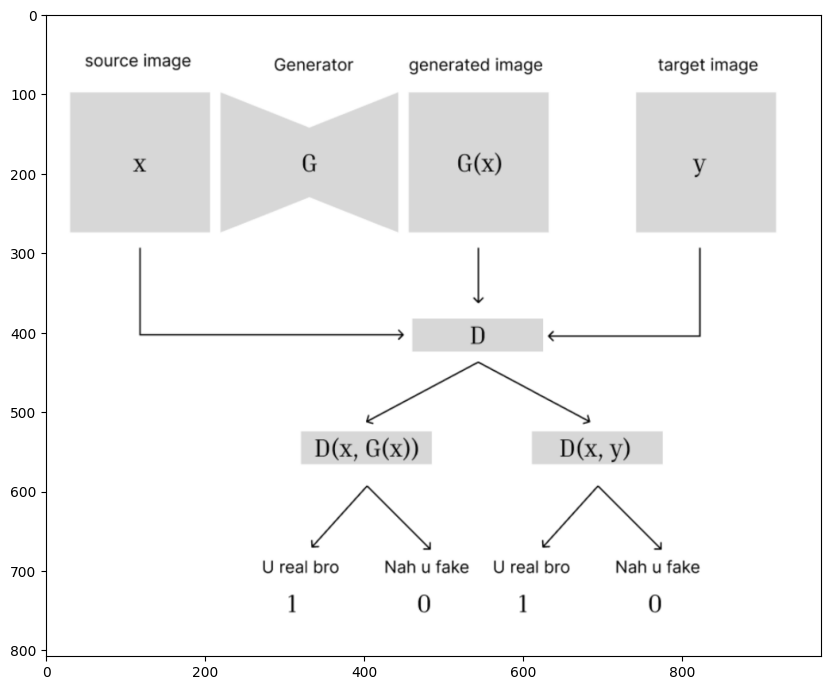

In [ ]:
illustration = PIL.Image.open("/content/Screenshot 2024-12-06 at 4.40.56 PM.png")
plt.figure(figsize = (10,10))
plt.imshow(illustration)

In [ ]:
def train(Generator,
          Discriminator,
          DataLoader,
          opt_gen,
          opt_disc,
          l1,
          bce,
          g_scaler,
          d_scaler):

  Generator.train()
  Discriminator.train()

  loop = tqdm(DataLoader, leave = True)

  for idx, (x,y) in enumerate(loop) :

    x = x.to(DEVICE)
    y = y.to(DEVICE)

    #Train Discriminator
    with torch.cuda.amp.autocast() :
      y_fake = Generator(x)
      D_real = Discriminator(x,y)
      D_real_loss = bce(D_real, torch.ones_like(D_real))
      D_fake = Discriminator(x,y_fake.detach())
      d_fake_loss = bce(D_fake, torch.zeros_like(D_fake))
      D_loss = (D_real_loss + d_fake_loss) / 2

    Discriminator.zero_grad()
    d_scaler.scale(D_loss).backward()
    d_scaler.step(opt_disc)
    d_scaler.update()

    #Train Generator
    with torch.cuda.amp.autocast() :
      D_fake = Discriminator(x,y_fake)
      G_fake_loss = bce(D_fake, torch.ones_like(D_fake))
      L1 = l1(y_fake, y) * L1_LAMBDA
      G_loss = G_fake_loss + L1

    opt_gen.zero_grad()
    g_scaler.scale(G_loss).backward()
    g_scaler.step(opt_gen)
    g_scaler.update()

In [ ]:
def main():
    disc = Discriminator(in_channels=3).to(DEVICE)
    gen = Generator(in_channels=3).to(DEVICE)

    opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
    opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
    BCE = nn.BCEWithLogitsLoss()
    L1_LOSS = nn.L1Loss()

    val_loss_list = []

    if LOAD_MODEL:
        load_checkpoint(CHECKPOINT_GEN, gen, opt_gen, LEARNING_RATE)
        load_checkpoint(CHECKPOINT_DISC, disc, opt_disc, LEARNING_RATE)

    train_dataset = CustomDataset(TRAIN_DIR)
    train_loader = DataLoader(
        train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS
    )

    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()

    val_dataset = CustomDataset(VAL_DIR)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    # Early stopping parameters
    best_val_loss = float("inf")
    patience = 200
    patience_counter = 0

    for epoch in range(NUM_EPOCHS):

        train(gen, disc, train_loader, opt_gen, opt_disc, L1_LOSS, BCE, g_scaler, d_scaler)

        # Evaluate on the validation set
        gen.eval()
        val_loss = 0
        with torch.no_grad():
            for val_data in val_loader:
                inputs, targets = val_data
                inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)

                # Generate predictions
                predictions = gen(inputs)
                val_loss += L1_LOSS(predictions, targets).item()

        val_loss /= len(val_loader)  # Average validation loss
        val_loss_list.append(val_loss)

        print(f"Epoch {epoch+1}/{NUM_EPOCHS}, Validation Loss: {val_loss:.4f}")

        # Check early stopping condition
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0

            save_checkpoint(gen, opt_gen, filename=CHECKPOINT_GEN)
            save_checkpoint(disc, opt_disc, filename=CHECKPOINT_DISC)
        else:
            patience_counter += 1

        # Stop training if patience is exceeded
        if patience_counter >= patience:
            print(f"Early stopping triggered. Stopping training at epoch {epoch}")
            break

        # Save some examples for visualization
        save_some_examples(gen, val_loader, epoch, folder="evaluation")

    # Save final models
    torch.save(gen.state_dict(), "gen_map.pth")
    torch.save(disc.state_dict(), "disc_map.pth")

    return val_loss_list


In [ ]:
val_loss_list = main()

<ipython-input-71-867cf47e01b3>:21: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  g_scaler = torch.cuda.amp.GradScaler()
<ipython-input-71-867cf47e01b3>:22: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  d_scaler = torch.cuda.amp.GradScaler()


['158.jpg', '121.jpg', '18.jpg', '112.jpg', '127.jpg', '162.jpg', '116.jpg', '123.jpg', '110.jpg', '244.jpg', '235.jpg', '196.jpg', '217.jpg', '101.jpg', '171.jpg', '224.jpg', '179.jpg', '10.jpg', '17.jpg', '125.jpg', '245.jpg', '195.jpg', '161.jpg', '194.jpg', '136.jpg', '227.jpg', '111.jpg', '141.jpg', '223.jpg', '182.jpg', '122.jpg', '147.jpg', '189.jpg', '184.jpg', '115.jpg', '133.jpg', '175.jpg', '239.jpg', '174.jpg', '201.jpg', '113.jpg', '154.jpg', '117.jpg', '242.jpg', '228.jpg', '20.jpg', '153.jpg', '206.jpg', '155.jpg', '186.jpg', '19.jpg', '139.jpg', '192.jpg', '104.jpg', '152.jpg', '157.jpg', '243.jpg', '126.jpg', '230.jpg', '190.jpg', '203.jpg', '219.jpg', '109.jpg', '197.jpg', '114.jpg', '240.jpg', '202.jpg', '142.jpg', '2.jpg', '187.jpg', '149.jpg', '238.jpg', '164.jpg', '213.jpg', '165.jpg', '146.jpg', '24.jpg', '169.jpg', '221.jpg', '214.jpg', '241.jpg', '233.jpg', '13.jpg', '218.jpg', '12.jpg', '131.jpg', '181.jpg', '156.jpg', '178.jpg', '118.jpg', '216.jpg', '204.jpg

  0%|          | 0/40 [00:00<?, ?it/s]<ipython-input-63-a09c9749e244>:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast() :
<ipython-input-63-a09c9749e244>:36: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast() :
100%|██████████| 40/40 [00:07<00:00,  5.25it/s]


Epoch 1/1000, Validation Loss: 0.5348
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Epoch 2/1000, Validation Loss: 0.5211
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:05<00:00,  6.73it/s]


Epoch 3/1000, Validation Loss: 0.4790
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:07<00:00,  5.09it/s]


Epoch 4/1000, Validation Loss: 0.4465
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:07<00:00,  5.13it/s]


Epoch 5/1000, Validation Loss: 0.4321
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:05<00:00,  6.81it/s]


Epoch 6/1000, Validation Loss: 0.4236
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:08<00:00,  4.74it/s]


Epoch 7/1000, Validation Loss: 0.4183
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:07<00:00,  5.30it/s]


Epoch 8/1000, Validation Loss: 0.4094
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 9/1000, Validation Loss: 0.4050
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:06<00:00,  6.15it/s]


Epoch 10/1000, Validation Loss: 0.3998
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:06<00:00,  5.79it/s]


Epoch 11/1000, Validation Loss: 0.3995
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:06<00:00,  6.65it/s]


Epoch 12/1000, Validation Loss: 0.3827
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:06<00:00,  6.34it/s]


Epoch 13/1000, Validation Loss: 0.3828


100%|██████████| 40/40 [00:05<00:00,  6.72it/s]


Epoch 14/1000, Validation Loss: 0.3843


100%|██████████| 40/40 [00:06<00:00,  5.84it/s]


Epoch 15/1000, Validation Loss: 0.3878


100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Epoch 16/1000, Validation Loss: 0.3860


100%|██████████| 40/40 [00:07<00:00,  5.51it/s]


Epoch 17/1000, Validation Loss: 0.3933


100%|██████████| 40/40 [00:05<00:00,  7.08it/s]


Epoch 18/1000, Validation Loss: 0.3898


100%|██████████| 40/40 [00:06<00:00,  5.75it/s]


Epoch 19/1000, Validation Loss: 0.3949


100%|██████████| 40/40 [00:05<00:00,  7.10it/s]


Epoch 20/1000, Validation Loss: 0.3869


100%|██████████| 40/40 [00:07<00:00,  5.48it/s]


Epoch 21/1000, Validation Loss: 0.3909


100%|██████████| 40/40 [00:05<00:00,  7.34it/s]


Epoch 22/1000, Validation Loss: 0.3893


100%|██████████| 40/40 [00:07<00:00,  5.33it/s]


Epoch 23/1000, Validation Loss: 0.3915


100%|██████████| 40/40 [00:05<00:00,  7.32it/s]


Epoch 24/1000, Validation Loss: 0.3966


100%|██████████| 40/40 [00:06<00:00,  5.95it/s]


Epoch 25/1000, Validation Loss: 0.3864


100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Epoch 26/1000, Validation Loss: 0.4044


100%|██████████| 40/40 [00:06<00:00,  6.00it/s]


Epoch 27/1000, Validation Loss: 0.3883


100%|██████████| 40/40 [00:05<00:00,  7.41it/s]


Epoch 28/1000, Validation Loss: 0.3929


100%|██████████| 40/40 [00:07<00:00,  5.31it/s]


Epoch 29/1000, Validation Loss: 0.3897


100%|██████████| 40/40 [00:05<00:00,  7.44it/s]


Epoch 30/1000, Validation Loss: 0.3859


100%|██████████| 40/40 [00:06<00:00,  5.80it/s]


Epoch 31/1000, Validation Loss: 0.3897


100%|██████████| 40/40 [00:05<00:00,  7.13it/s]


Epoch 32/1000, Validation Loss: 0.3878


100%|██████████| 40/40 [00:06<00:00,  6.07it/s]


Epoch 33/1000, Validation Loss: 0.3973


100%|██████████| 40/40 [00:05<00:00,  7.18it/s]


Epoch 34/1000, Validation Loss: 0.3860


100%|██████████| 40/40 [00:06<00:00,  5.97it/s]


Epoch 35/1000, Validation Loss: 0.3853


100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Epoch 36/1000, Validation Loss: 0.3934


100%|██████████| 40/40 [00:07<00:00,  5.69it/s]


Epoch 37/1000, Validation Loss: 0.3921


100%|██████████| 40/40 [00:05<00:00,  6.98it/s]


Epoch 38/1000, Validation Loss: 0.3879


100%|██████████| 40/40 [00:06<00:00,  6.28it/s]


Epoch 39/1000, Validation Loss: 0.3909


100%|██████████| 40/40 [00:05<00:00,  6.82it/s]


Epoch 40/1000, Validation Loss: 0.3951


100%|██████████| 40/40 [00:06<00:00,  6.27it/s]


Epoch 41/1000, Validation Loss: 0.3922


100%|██████████| 40/40 [00:06<00:00,  6.49it/s]


Epoch 42/1000, Validation Loss: 0.3994


100%|██████████| 40/40 [00:06<00:00,  6.62it/s]


Epoch 43/1000, Validation Loss: 0.3966


100%|██████████| 40/40 [00:06<00:00,  6.42it/s]


Epoch 44/1000, Validation Loss: 0.3869


100%|██████████| 40/40 [00:05<00:00,  7.15it/s]


Epoch 45/1000, Validation Loss: 0.3850


100%|██████████| 40/40 [00:06<00:00,  5.78it/s]


Epoch 46/1000, Validation Loss: 0.3875


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 47/1000, Validation Loss: 0.3871


100%|██████████| 40/40 [00:07<00:00,  5.64it/s]


Epoch 48/1000, Validation Loss: 0.3909


100%|██████████| 40/40 [00:05<00:00,  7.07it/s]


Epoch 49/1000, Validation Loss: 0.3871


100%|██████████| 40/40 [00:07<00:00,  5.39it/s]


Epoch 50/1000, Validation Loss: 0.3971


100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Epoch 51/1000, Validation Loss: 0.3893


100%|██████████| 40/40 [00:07<00:00,  5.32it/s]


Epoch 52/1000, Validation Loss: 0.3989


100%|██████████| 40/40 [00:05<00:00,  7.42it/s]


Epoch 53/1000, Validation Loss: 0.3977


100%|██████████| 40/40 [00:07<00:00,  5.13it/s]


Epoch 54/1000, Validation Loss: 0.3895


100%|██████████| 40/40 [00:05<00:00,  7.07it/s]


Epoch 55/1000, Validation Loss: 0.4016


100%|██████████| 40/40 [00:07<00:00,  5.60it/s]


Epoch 56/1000, Validation Loss: 0.3901


100%|██████████| 40/40 [00:05<00:00,  7.10it/s]


Epoch 57/1000, Validation Loss: 0.4087


100%|██████████| 40/40 [00:07<00:00,  5.61it/s]


Epoch 58/1000, Validation Loss: 0.3828


100%|██████████| 40/40 [00:05<00:00,  7.42it/s]


Epoch 59/1000, Validation Loss: 0.3977


100%|██████████| 40/40 [00:07<00:00,  5.62it/s]


Epoch 60/1000, Validation Loss: 0.3853


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 61/1000, Validation Loss: 0.4118


100%|██████████| 40/40 [00:06<00:00,  5.86it/s]


Epoch 62/1000, Validation Loss: 0.3926


100%|██████████| 40/40 [00:05<00:00,  7.11it/s]


Epoch 63/1000, Validation Loss: 0.4115


100%|██████████| 40/40 [00:06<00:00,  5.88it/s]


Epoch 64/1000, Validation Loss: 0.4024


100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Epoch 65/1000, Validation Loss: 0.3913


100%|██████████| 40/40 [00:06<00:00,  5.90it/s]


Epoch 66/1000, Validation Loss: 0.4032


100%|██████████| 40/40 [00:05<00:00,  7.31it/s]


Epoch 67/1000, Validation Loss: 0.3942


100%|██████████| 40/40 [00:06<00:00,  6.18it/s]


Epoch 68/1000, Validation Loss: 0.3821
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 40/40 [00:06<00:00,  6.55it/s]


Epoch 69/1000, Validation Loss: 0.3914


100%|██████████| 40/40 [00:07<00:00,  5.29it/s]


Epoch 70/1000, Validation Loss: 0.3911


100%|██████████| 40/40 [00:05<00:00,  7.31it/s]


Epoch 71/1000, Validation Loss: 0.3957


100%|██████████| 40/40 [00:07<00:00,  5.67it/s]


Epoch 72/1000, Validation Loss: 0.3897


100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Epoch 73/1000, Validation Loss: 0.3848


100%|██████████| 40/40 [00:06<00:00,  5.83it/s]


Epoch 74/1000, Validation Loss: 0.4081


100%|██████████| 40/40 [00:05<00:00,  6.99it/s]


Epoch 75/1000, Validation Loss: 0.3845


100%|██████████| 40/40 [00:06<00:00,  6.10it/s]


Epoch 76/1000, Validation Loss: 0.3883


100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Epoch 77/1000, Validation Loss: 0.3896


100%|██████████| 40/40 [00:06<00:00,  6.00it/s]


Epoch 78/1000, Validation Loss: 0.3863


100%|██████████| 40/40 [00:05<00:00,  7.16it/s]


Epoch 79/1000, Validation Loss: 0.3939


100%|██████████| 40/40 [00:06<00:00,  6.16it/s]


Epoch 80/1000, Validation Loss: 0.3928


100%|██████████| 40/40 [00:06<00:00,  6.37it/s]


Epoch 81/1000, Validation Loss: 0.3883


100%|██████████| 40/40 [00:06<00:00,  6.29it/s]


Epoch 82/1000, Validation Loss: 0.3934


100%|██████████| 40/40 [00:05<00:00,  6.93it/s]


Epoch 83/1000, Validation Loss: 0.3975


100%|██████████| 40/40 [00:06<00:00,  6.34it/s]


Epoch 84/1000, Validation Loss: 0.3826


100%|██████████| 40/40 [00:05<00:00,  7.02it/s]


Epoch 85/1000, Validation Loss: 0.3953


100%|██████████| 40/40 [00:06<00:00,  6.09it/s]


Epoch 86/1000, Validation Loss: 0.3987


100%|██████████| 40/40 [00:05<00:00,  6.82it/s]


Epoch 87/1000, Validation Loss: 0.3929


100%|██████████| 40/40 [00:05<00:00,  6.80it/s]


Epoch 88/1000, Validation Loss: 0.3863


100%|██████████| 40/40 [00:06<00:00,  6.06it/s]


Epoch 89/1000, Validation Loss: 0.3947


100%|██████████| 40/40 [00:05<00:00,  6.96it/s]


Epoch 90/1000, Validation Loss: 0.3881


100%|██████████| 40/40 [00:06<00:00,  5.83it/s]


Epoch 91/1000, Validation Loss: 0.3904


100%|██████████| 40/40 [00:05<00:00,  7.05it/s]


Epoch 92/1000, Validation Loss: 0.3963


100%|██████████| 40/40 [00:06<00:00,  5.75it/s]


Epoch 93/1000, Validation Loss: 0.3947


100%|██████████| 40/40 [00:05<00:00,  7.34it/s]


Epoch 94/1000, Validation Loss: 0.3974


100%|██████████| 40/40 [00:07<00:00,  5.14it/s]


Epoch 95/1000, Validation Loss: 0.3903


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 96/1000, Validation Loss: 0.4070


100%|██████████| 40/40 [00:07<00:00,  5.36it/s]


Epoch 97/1000, Validation Loss: 0.3873


100%|██████████| 40/40 [00:05<00:00,  6.99it/s]


Epoch 98/1000, Validation Loss: 0.3956


100%|██████████| 40/40 [00:06<00:00,  5.79it/s]


Epoch 99/1000, Validation Loss: 0.3982


100%|██████████| 40/40 [00:05<00:00,  7.11it/s]


Epoch 100/1000, Validation Loss: 0.3975


100%|██████████| 40/40 [00:07<00:00,  5.44it/s]


Epoch 101/1000, Validation Loss: 0.3999


100%|██████████| 40/40 [00:05<00:00,  7.39it/s]


Epoch 102/1000, Validation Loss: 0.3909


100%|██████████| 40/40 [00:07<00:00,  5.58it/s]


Epoch 103/1000, Validation Loss: 0.4076


100%|██████████| 40/40 [00:05<00:00,  7.25it/s]


Epoch 104/1000, Validation Loss: 0.3954


100%|██████████| 40/40 [00:06<00:00,  5.74it/s]


Epoch 105/1000, Validation Loss: 0.3933


100%|██████████| 40/40 [00:05<00:00,  7.09it/s]


Epoch 106/1000, Validation Loss: 0.3959


100%|██████████| 40/40 [00:06<00:00,  5.72it/s]


Epoch 107/1000, Validation Loss: 0.3932


100%|██████████| 40/40 [00:05<00:00,  7.32it/s]


Epoch 108/1000, Validation Loss: 0.3916


100%|██████████| 40/40 [00:06<00:00,  5.84it/s]


Epoch 109/1000, Validation Loss: 0.3923


100%|██████████| 40/40 [00:05<00:00,  7.43it/s]


Epoch 110/1000, Validation Loss: 0.3946


100%|██████████| 40/40 [00:06<00:00,  6.19it/s]


Epoch 111/1000, Validation Loss: 0.3877


100%|██████████| 40/40 [00:05<00:00,  6.71it/s]


Epoch 112/1000, Validation Loss: 0.3968


100%|██████████| 40/40 [00:05<00:00,  6.73it/s]


Epoch 113/1000, Validation Loss: 0.3994


100%|██████████| 40/40 [00:05<00:00,  6.68it/s]


Epoch 114/1000, Validation Loss: 0.4031


100%|██████████| 40/40 [00:06<00:00,  6.51it/s]


Epoch 115/1000, Validation Loss: 0.3893


100%|██████████| 40/40 [00:06<00:00,  6.58it/s]


Epoch 116/1000, Validation Loss: 0.3946


100%|██████████| 40/40 [00:05<00:00,  6.74it/s]


Epoch 117/1000, Validation Loss: 0.3950


100%|██████████| 40/40 [00:06<00:00,  6.46it/s]


Epoch 118/1000, Validation Loss: 0.4096


100%|██████████| 40/40 [00:05<00:00,  7.21it/s]


Epoch 119/1000, Validation Loss: 0.3922


100%|██████████| 40/40 [00:07<00:00,  5.54it/s]


Epoch 120/1000, Validation Loss: 0.4086


100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Epoch 121/1000, Validation Loss: 0.3975


100%|██████████| 40/40 [00:07<00:00,  5.38it/s]


Epoch 122/1000, Validation Loss: 0.4143


100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Epoch 123/1000, Validation Loss: 0.3933


100%|██████████| 40/40 [00:07<00:00,  5.56it/s]


Epoch 124/1000, Validation Loss: 0.4023


100%|██████████| 40/40 [00:05<00:00,  7.18it/s]


Epoch 125/1000, Validation Loss: 0.4001


100%|██████████| 40/40 [00:07<00:00,  5.58it/s]


Epoch 126/1000, Validation Loss: 0.3954


100%|██████████| 40/40 [00:05<00:00,  7.32it/s]


Epoch 127/1000, Validation Loss: 0.4058


100%|██████████| 40/40 [00:07<00:00,  5.61it/s]


Epoch 128/1000, Validation Loss: 0.3985


100%|██████████| 40/40 [00:05<00:00,  7.34it/s]


Epoch 129/1000, Validation Loss: 0.3996


100%|██████████| 40/40 [00:06<00:00,  5.93it/s]


Epoch 130/1000, Validation Loss: 0.4089


100%|██████████| 40/40 [00:05<00:00,  7.03it/s]


Epoch 131/1000, Validation Loss: 0.4010


100%|██████████| 40/40 [00:06<00:00,  5.95it/s]


Epoch 132/1000, Validation Loss: 0.4026


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 133/1000, Validation Loss: 0.4019


100%|██████████| 40/40 [00:06<00:00,  6.11it/s]


Epoch 134/1000, Validation Loss: 0.4054


100%|██████████| 40/40 [00:05<00:00,  7.23it/s]


Epoch 135/1000, Validation Loss: 0.3959


100%|██████████| 40/40 [00:06<00:00,  6.18it/s]


Epoch 136/1000, Validation Loss: 0.4006


100%|██████████| 40/40 [00:05<00:00,  6.73it/s]


Epoch 137/1000, Validation Loss: 0.3988


100%|██████████| 40/40 [00:05<00:00,  6.73it/s]


Epoch 138/1000, Validation Loss: 0.4087


100%|██████████| 40/40 [00:06<00:00,  6.46it/s]


Epoch 139/1000, Validation Loss: 0.3940


100%|██████████| 40/40 [00:06<00:00,  6.65it/s]


Epoch 140/1000, Validation Loss: 0.4065


100%|██████████| 40/40 [00:06<00:00,  6.19it/s]


Epoch 141/1000, Validation Loss: 0.4028


100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Epoch 142/1000, Validation Loss: 0.3956


100%|██████████| 40/40 [00:06<00:00,  5.73it/s]


Epoch 143/1000, Validation Loss: 0.4005


100%|██████████| 40/40 [00:05<00:00,  7.38it/s]


Epoch 144/1000, Validation Loss: 0.4003


100%|██████████| 40/40 [00:07<00:00,  5.48it/s]


Epoch 145/1000, Validation Loss: 0.3974


100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Epoch 146/1000, Validation Loss: 0.3918


100%|██████████| 40/40 [00:07<00:00,  5.29it/s]


Epoch 147/1000, Validation Loss: 0.3952


100%|██████████| 40/40 [00:05<00:00,  6.99it/s]


Epoch 148/1000, Validation Loss: 0.3926


100%|██████████| 40/40 [00:06<00:00,  5.77it/s]


Epoch 149/1000, Validation Loss: 0.3922


100%|██████████| 40/40 [00:05<00:00,  7.34it/s]


Epoch 150/1000, Validation Loss: 0.3917


100%|██████████| 40/40 [00:06<00:00,  5.91it/s]


Epoch 151/1000, Validation Loss: 0.3968


100%|██████████| 40/40 [00:05<00:00,  7.38it/s]


Epoch 152/1000, Validation Loss: 0.4020


100%|██████████| 40/40 [00:06<00:00,  5.97it/s]


Epoch 153/1000, Validation Loss: 0.3976


100%|██████████| 40/40 [00:05<00:00,  7.23it/s]


Epoch 154/1000, Validation Loss: 0.3983


100%|██████████| 40/40 [00:06<00:00,  6.48it/s]


Epoch 155/1000, Validation Loss: 0.3944


100%|██████████| 40/40 [00:05<00:00,  7.01it/s]


Epoch 156/1000, Validation Loss: 0.4149


100%|██████████| 40/40 [00:06<00:00,  6.51it/s]


Epoch 157/1000, Validation Loss: 0.3975


100%|██████████| 40/40 [00:06<00:00,  6.56it/s]


Epoch 158/1000, Validation Loss: 0.3998


100%|██████████| 40/40 [00:05<00:00,  6.72it/s]


Epoch 159/1000, Validation Loss: 0.4003


100%|██████████| 40/40 [00:06<00:00,  5.88it/s]


Epoch 160/1000, Validation Loss: 0.4041


100%|██████████| 40/40 [00:05<00:00,  6.89it/s]


Epoch 161/1000, Validation Loss: 0.4083


100%|██████████| 40/40 [00:07<00:00,  5.69it/s]


Epoch 162/1000, Validation Loss: 0.4036


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 163/1000, Validation Loss: 0.4022


100%|██████████| 40/40 [00:07<00:00,  5.19it/s]


Epoch 164/1000, Validation Loss: 0.4061


100%|██████████| 40/40 [00:05<00:00,  7.27it/s]


Epoch 165/1000, Validation Loss: 0.4062


100%|██████████| 40/40 [00:07<00:00,  5.44it/s]


Epoch 166/1000, Validation Loss: 0.4089


100%|██████████| 40/40 [00:05<00:00,  7.00it/s]


Epoch 167/1000, Validation Loss: 0.3936


100%|██████████| 40/40 [00:07<00:00,  5.45it/s]


Epoch 168/1000, Validation Loss: 0.4056


100%|██████████| 40/40 [00:05<00:00,  7.33it/s]


Epoch 169/1000, Validation Loss: 0.4028


100%|██████████| 40/40 [00:07<00:00,  5.61it/s]


Epoch 170/1000, Validation Loss: 0.3965


100%|██████████| 40/40 [00:05<00:00,  7.42it/s]


Epoch 171/1000, Validation Loss: 0.3969


100%|██████████| 40/40 [00:06<00:00,  5.85it/s]


Epoch 172/1000, Validation Loss: 0.4048


100%|██████████| 40/40 [00:05<00:00,  7.07it/s]


Epoch 173/1000, Validation Loss: 0.4013


100%|██████████| 40/40 [00:06<00:00,  5.83it/s]


Epoch 174/1000, Validation Loss: 0.3951


100%|██████████| 40/40 [00:05<00:00,  7.40it/s]


Epoch 175/1000, Validation Loss: 0.3910


100%|██████████| 40/40 [00:06<00:00,  6.12it/s]


Epoch 176/1000, Validation Loss: 0.3900


100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Epoch 177/1000, Validation Loss: 0.3959


100%|██████████| 40/40 [00:06<00:00,  6.17it/s]


Epoch 178/1000, Validation Loss: 0.4088


100%|██████████| 40/40 [00:05<00:00,  7.23it/s]


Epoch 179/1000, Validation Loss: 0.4024


100%|██████████| 40/40 [00:06<00:00,  6.51it/s]


Epoch 180/1000, Validation Loss: 0.4157


100%|██████████| 40/40 [00:06<00:00,  6.61it/s]


Epoch 181/1000, Validation Loss: 0.4019


100%|██████████| 40/40 [00:06<00:00,  6.45it/s]


Epoch 182/1000, Validation Loss: 0.3979


100%|██████████| 40/40 [00:06<00:00,  6.63it/s]


Epoch 183/1000, Validation Loss: 0.4068


100%|██████████| 40/40 [00:06<00:00,  6.55it/s]


Epoch 184/1000, Validation Loss: 0.4033


100%|██████████| 40/40 [00:06<00:00,  6.65it/s]


Epoch 185/1000, Validation Loss: 0.4038


100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Epoch 186/1000, Validation Loss: 0.4024


100%|██████████| 40/40 [00:06<00:00,  5.82it/s]


Epoch 187/1000, Validation Loss: 0.4030


100%|██████████| 40/40 [00:05<00:00,  7.19it/s]


Epoch 188/1000, Validation Loss: 0.3995


100%|██████████| 40/40 [00:06<00:00,  5.81it/s]


Epoch 189/1000, Validation Loss: 0.4066


100%|██████████| 40/40 [00:05<00:00,  7.07it/s]


Epoch 190/1000, Validation Loss: 0.4049


100%|██████████| 40/40 [00:07<00:00,  5.58it/s]


Epoch 191/1000, Validation Loss: 0.4006


100%|██████████| 40/40 [00:05<00:00,  6.99it/s]


Epoch 192/1000, Validation Loss: 0.4017


100%|██████████| 40/40 [00:07<00:00,  5.28it/s]


Epoch 193/1000, Validation Loss: 0.3927


100%|██████████| 40/40 [00:05<00:00,  7.38it/s]


Epoch 194/1000, Validation Loss: 0.4064


100%|██████████| 40/40 [00:07<00:00,  5.53it/s]


Epoch 195/1000, Validation Loss: 0.3987


100%|██████████| 40/40 [00:05<00:00,  7.28it/s]


Epoch 196/1000, Validation Loss: 0.4107


100%|██████████| 40/40 [00:06<00:00,  6.05it/s]


Epoch 197/1000, Validation Loss: 0.3918


100%|██████████| 40/40 [00:05<00:00,  7.01it/s]


Epoch 198/1000, Validation Loss: 0.4007


100%|██████████| 40/40 [00:06<00:00,  5.84it/s]


Epoch 199/1000, Validation Loss: 0.4067


100%|██████████| 40/40 [00:05<00:00,  7.34it/s]


Epoch 200/1000, Validation Loss: 0.3924


100%|██████████| 40/40 [00:06<00:00,  5.96it/s]


Epoch 201/1000, Validation Loss: 0.3967


100%|██████████| 40/40 [00:05<00:00,  7.28it/s]


Epoch 202/1000, Validation Loss: 0.4041


100%|██████████| 40/40 [00:06<00:00,  6.13it/s]


Epoch 203/1000, Validation Loss: 0.4057


100%|██████████| 40/40 [00:05<00:00,  6.99it/s]


Epoch 204/1000, Validation Loss: 0.3965


100%|██████████| 40/40 [00:06<00:00,  6.29it/s]


Epoch 205/1000, Validation Loss: 0.4101


100%|██████████| 40/40 [00:05<00:00,  6.88it/s]


Epoch 206/1000, Validation Loss: 0.3951


100%|██████████| 40/40 [00:06<00:00,  6.01it/s]


Epoch 207/1000, Validation Loss: 0.4007


100%|██████████| 40/40 [00:05<00:00,  6.97it/s]


Epoch 208/1000, Validation Loss: 0.4094


100%|██████████| 40/40 [00:06<00:00,  6.32it/s]


Epoch 209/1000, Validation Loss: 0.4003


100%|██████████| 40/40 [00:05<00:00,  6.86it/s]


Epoch 210/1000, Validation Loss: 0.4028


100%|██████████| 40/40 [00:06<00:00,  6.63it/s]


Epoch 211/1000, Validation Loss: 0.4035


100%|██████████| 40/40 [00:06<00:00,  6.43it/s]


Epoch 212/1000, Validation Loss: 0.4019


100%|██████████| 40/40 [00:05<00:00,  6.87it/s]


Epoch 213/1000, Validation Loss: 0.3948


100%|██████████| 40/40 [00:06<00:00,  6.03it/s]


Epoch 214/1000, Validation Loss: 0.3979


100%|██████████| 40/40 [00:05<00:00,  7.11it/s]


Epoch 215/1000, Validation Loss: 0.3963


100%|██████████| 40/40 [00:06<00:00,  6.10it/s]


Epoch 216/1000, Validation Loss: 0.4025


100%|██████████| 40/40 [00:05<00:00,  7.01it/s]


Epoch 217/1000, Validation Loss: 0.3961


100%|██████████| 40/40 [00:07<00:00,  5.54it/s]


Epoch 218/1000, Validation Loss: 0.3985


100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Epoch 219/1000, Validation Loss: 0.3999


100%|██████████| 40/40 [00:07<00:00,  5.31it/s]


Epoch 220/1000, Validation Loss: 0.4043


100%|██████████| 40/40 [00:05<00:00,  7.15it/s]


Epoch 221/1000, Validation Loss: 0.4072


100%|██████████| 40/40 [00:07<00:00,  5.52it/s]


Epoch 222/1000, Validation Loss: 0.3948


100%|██████████| 40/40 [00:05<00:00,  7.03it/s]


Epoch 223/1000, Validation Loss: 0.4037


100%|██████████| 40/40 [00:07<00:00,  5.70it/s]


Epoch 224/1000, Validation Loss: 0.3938


100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Epoch 225/1000, Validation Loss: 0.3912


100%|██████████| 40/40 [00:06<00:00,  5.80it/s]


Epoch 226/1000, Validation Loss: 0.4048


100%|██████████| 40/40 [00:05<00:00,  7.37it/s]


Epoch 227/1000, Validation Loss: 0.3974


100%|██████████| 40/40 [00:06<00:00,  6.38it/s]


Epoch 228/1000, Validation Loss: 0.4031


100%|██████████| 40/40 [00:05<00:00,  6.87it/s]


Epoch 229/1000, Validation Loss: 0.4075


100%|██████████| 40/40 [00:06<00:00,  6.52it/s]


Epoch 230/1000, Validation Loss: 0.3917


100%|██████████| 40/40 [00:05<00:00,  6.77it/s]


Epoch 231/1000, Validation Loss: 0.4039


100%|██████████| 40/40 [00:06<00:00,  6.30it/s]


Epoch 232/1000, Validation Loss: 0.4051


100%|██████████| 40/40 [00:05<00:00,  6.74it/s]


Epoch 233/1000, Validation Loss: 0.4004


100%|██████████| 40/40 [00:06<00:00,  6.62it/s]


Epoch 234/1000, Validation Loss: 0.4007


100%|██████████| 40/40 [00:05<00:00,  6.71it/s]


Epoch 235/1000, Validation Loss: 0.4007


100%|██████████| 40/40 [00:05<00:00,  6.95it/s]


Epoch 236/1000, Validation Loss: 0.3947


100%|██████████| 40/40 [00:06<00:00,  6.48it/s]


Epoch 237/1000, Validation Loss: 0.3984


100%|██████████| 40/40 [00:06<00:00,  6.64it/s]


Epoch 238/1000, Validation Loss: 0.3988


100%|██████████| 40/40 [00:06<00:00,  6.63it/s]


Epoch 239/1000, Validation Loss: 0.4022


100%|██████████| 40/40 [00:06<00:00,  6.65it/s]


Epoch 240/1000, Validation Loss: 0.3963


100%|██████████| 40/40 [00:06<00:00,  6.13it/s]


Epoch 241/1000, Validation Loss: 0.3984


100%|██████████| 40/40 [00:05<00:00,  7.10it/s]


Epoch 242/1000, Validation Loss: 0.3941


100%|██████████| 40/40 [00:06<00:00,  5.80it/s]


Epoch 243/1000, Validation Loss: 0.4048


100%|██████████| 40/40 [00:05<00:00,  7.38it/s]


Epoch 244/1000, Validation Loss: 0.3890


100%|██████████| 40/40 [00:07<00:00,  5.48it/s]


Epoch 245/1000, Validation Loss: 0.4015


100%|██████████| 40/40 [00:05<00:00,  7.24it/s]


Epoch 246/1000, Validation Loss: 0.3992


100%|██████████| 40/40 [00:07<00:00,  5.64it/s]


Epoch 247/1000, Validation Loss: 0.4069


100%|██████████| 40/40 [00:05<00:00,  7.00it/s]


Epoch 248/1000, Validation Loss: 0.3986


100%|██████████| 40/40 [00:06<00:00,  5.86it/s]


Epoch 249/1000, Validation Loss: 0.4067


100%|██████████| 40/40 [00:05<00:00,  7.43it/s]


Epoch 250/1000, Validation Loss: 0.3892


100%|██████████| 40/40 [00:07<00:00,  5.25it/s]


Epoch 251/1000, Validation Loss: 0.4142


100%|██████████| 40/40 [00:05<00:00,  7.35it/s]


Epoch 252/1000, Validation Loss: 0.3937


100%|██████████| 40/40 [00:07<00:00,  5.46it/s]


Epoch 253/1000, Validation Loss: 0.4027


100%|██████████| 40/40 [00:05<00:00,  7.06it/s]


Epoch 254/1000, Validation Loss: 0.3983


100%|██████████| 40/40 [00:06<00:00,  5.91it/s]


Epoch 255/1000, Validation Loss: 0.4020


100%|██████████| 40/40 [00:05<00:00,  7.04it/s]


Epoch 256/1000, Validation Loss: 0.4019


100%|██████████| 40/40 [00:06<00:00,  6.06it/s]


Epoch 257/1000, Validation Loss: 0.4010


100%|██████████| 40/40 [00:05<00:00,  7.36it/s]


Epoch 258/1000, Validation Loss: 0.3984


100%|██████████| 40/40 [00:06<00:00,  6.20it/s]


Epoch 259/1000, Validation Loss: 0.3973


100%|██████████| 40/40 [00:05<00:00,  7.02it/s]


Epoch 260/1000, Validation Loss: 0.3889


100%|██████████| 40/40 [00:06<00:00,  6.29it/s]


Epoch 261/1000, Validation Loss: 0.3990


100%|██████████| 40/40 [00:05<00:00,  6.90it/s]


Epoch 262/1000, Validation Loss: 0.4014


100%|██████████| 40/40 [00:06<00:00,  6.49it/s]


Epoch 263/1000, Validation Loss: 0.4003


100%|██████████| 40/40 [00:06<00:00,  6.50it/s]


Epoch 264/1000, Validation Loss: 0.4030


100%|██████████| 40/40 [00:06<00:00,  6.59it/s]


Epoch 265/1000, Validation Loss: 0.3942


100%|██████████| 40/40 [00:06<00:00,  6.51it/s]


Epoch 266/1000, Validation Loss: 0.3969


100%|██████████| 40/40 [00:05<00:00,  6.69it/s]


Epoch 267/1000, Validation Loss: 0.3957


100%|██████████| 40/40 [00:06<00:00,  5.92it/s]


Epoch 268/1000, Validation Loss: 0.3949
Early stopping triggered. Stopping training at epoch 267


In [ ]:
#visulaize the losses
import matplotlib.pyplot as plt

def plot_losses(L1_list):
    plt.figure(figsize=(10, 5))
    plt.plot(val_loss_list, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Validation Loss Over Epochs')
    plt.legend()
    plt.show()


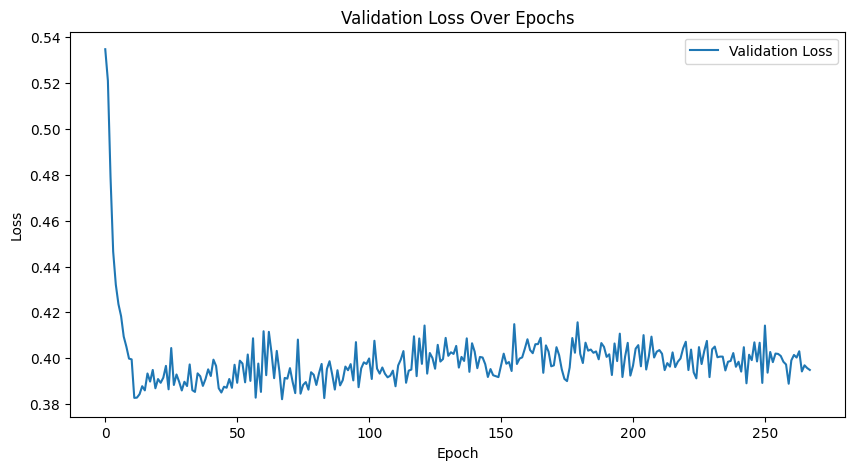

In [ ]:
plot_losses(val_loss_list)

# Tensorboard

tnsorboard was used to check the differece in results over the 1000 epochs and see how the model was getting better

the plots were seperated for 3 ones, input - predicted - target. to see where the problem was an whether we can solve it in a specific approache or not

In [ ]:
!pip install tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Loading pretrained model

The Generator was trained on 1000 Epochs to ensure good results

In [ ]:
gen = Generator(in_channels = 3).to(DEVICE)
disc = Discriminator(in_channels = 3).to(DEVICE)

gen.load_state_dict(torch.load("/content/drive/MyDrive/ICS471 - Project/state/gen.pth"))
disc.load_state_dict(torch.load("/content/drive/MyDrive/ICS471 - Project/state/disc.pth"))

<ipython-input-75-bdc0e5257acc>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen.load_state_dict(torch.load("/content/drive/MyDrive/ICS471 - Project/state/gen.pth"))
<ip

<All keys matched successfully>

In [ ]:
#calculating Testing loss
def calculate_test_loss(gen, test_loader, device):
    """
    Calculate the testing loss for a trained generator model.

    Parameters:
    gen (nn.Module): The trained generator model.
    test_loader (DataLoader): DataLoader for the test dataset.
    device (torch.device): The device to use (e.g., "cuda" or "cpu").
    l1_loss_fn (nn.L1Loss): The L1 loss function.

    Returns:
    float: The average test loss over the test dataset.
    """
    gen.eval()  # Set generator to evaluation mode
    test_loss = 0
    l1_loss_fn = nn.L1Loss()

    with torch.no_grad():  # Disable gradient calculation for testing
        for test_data in test_loader:
            inputs, targets = test_data
            inputs, targets = inputs.to(device), targets.to(device)

            # Generate predictions
            predictions = gen(inputs)

            # Calculate L1 loss
            test_loss += l1_loss_fn(predictions, targets).item()

    test_loss /= len(test_loader)  # Average test loss
    print(f"Test Loss: {test_loss:.4f}")
    return test_loss


In [ ]:
test_loss = calculate_test_loss(gen, test_loader, DEVICE)
print(f"Average Test Loss: {test_loss:.4f}")

Test Loss: 0.0593
Average Test Loss: 0.0593


In [ ]:
def test_img(img_path,gen) :

  gen_test = gen(img_path)
  gen_test = gen_test * 0.5 + 0.5

  plt.title("Original Image")
  plt.imshow(img_path.squeeze(0).permute(1,2,0).detach().cpu())
  plt.show()

  plt.title("Generated Image")
  plt.imshow(gen_test.squeeze(0).permute(1,2,0).detach().cpu())
  plt.show()

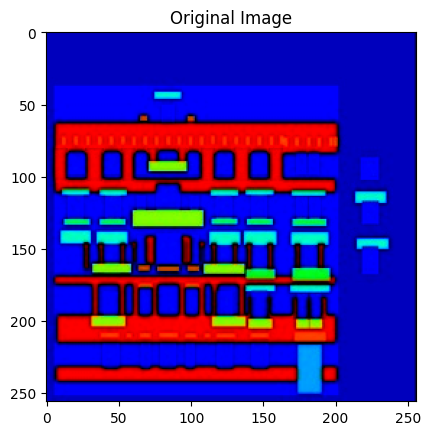

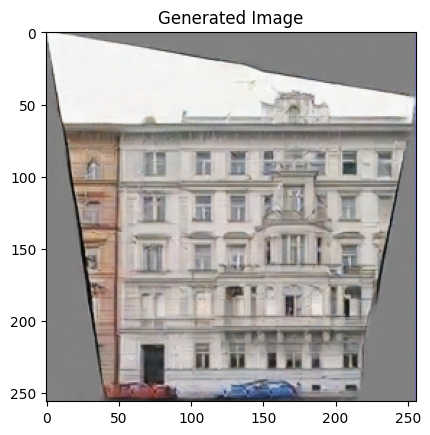

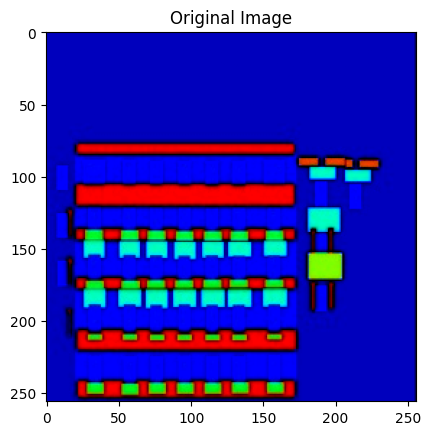

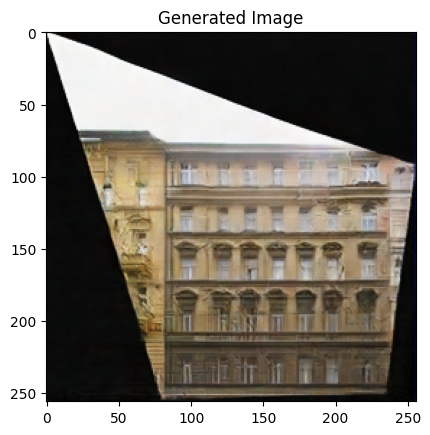

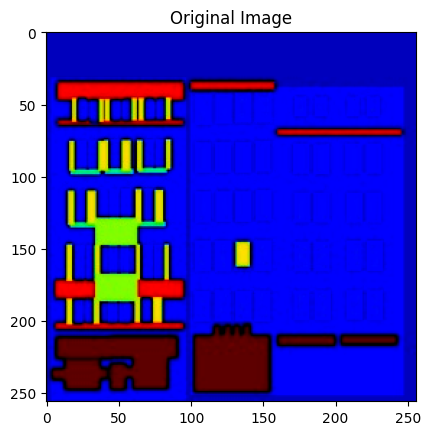

...

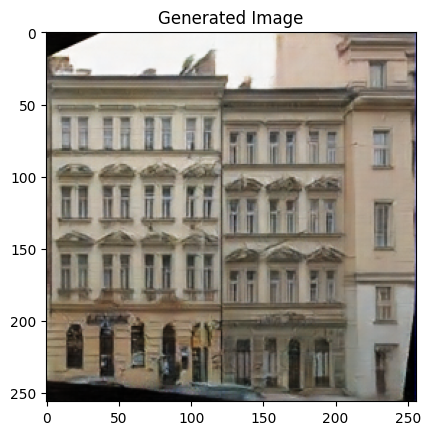

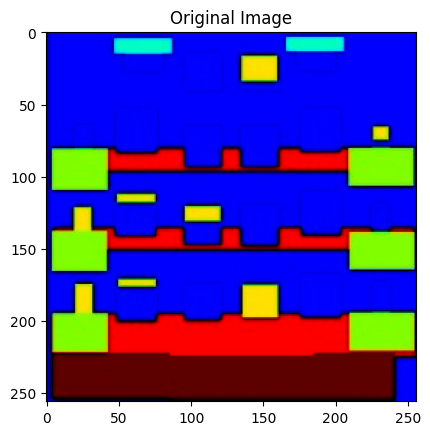

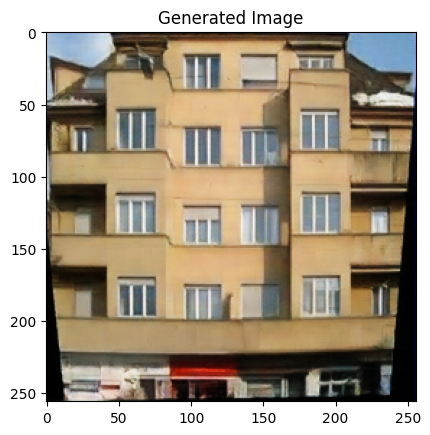

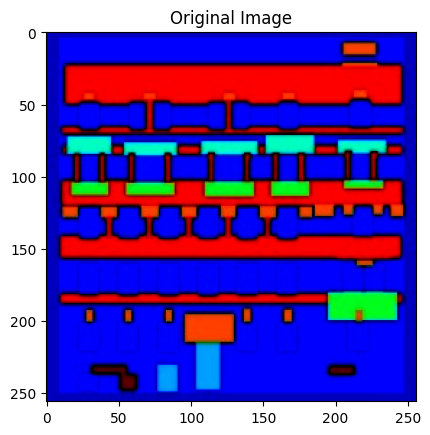

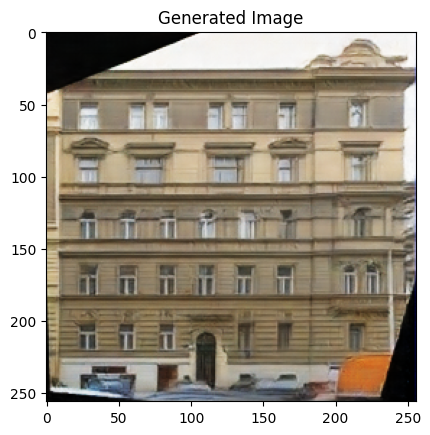

In [ ]:
for idx,img in enumerate(test_loader) :

  img = img[0].to(DEVICE)
  test_img(img,gen)

  if idx == 10 :
    break




# Conclusion

By implementing the [Pix2Pix](https://arxiv.org/abs/1611.07004) paper, we have successfully demonstrated how **conditional adversarial networks** can be used for **image-to-image translation**. This implementation not only enables us to experiment with various datasets but also provides a flexible framework for fine-tuning models for different tasks.

### Next Steps:
- **Explore New Datasets**: We aim to test the model with diverse datasets to evaluate its adaptability and performance.
- **Experiment with Custom Architectures**: Future efforts will focus on modifying the network to address domain-specific challenges.

